In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
x = load('/kaggle/input/coco-2017-dataset/coco2017/val2017/000000000785.jpg')
print(x.shape)

(425, 640, 3)


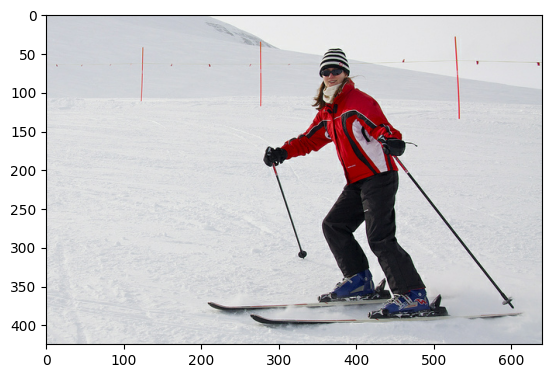

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

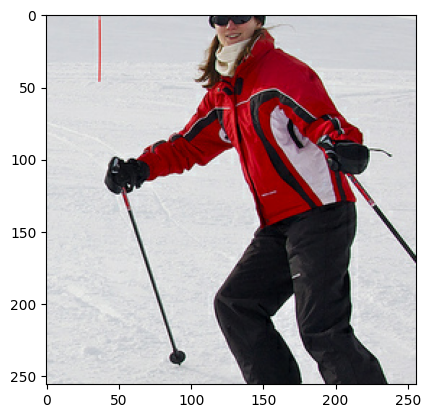

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

In [14]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

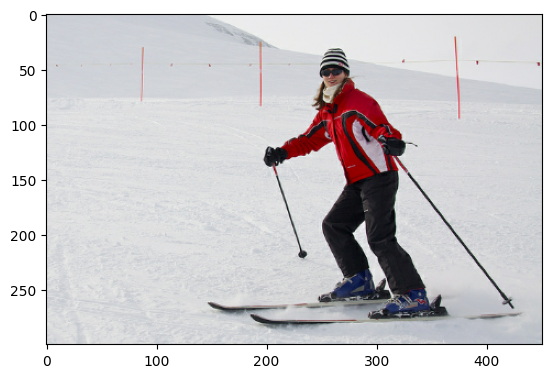

In [15]:
x = resize_with_aspect_ratio(x,300)
plt.imshow(x/255)

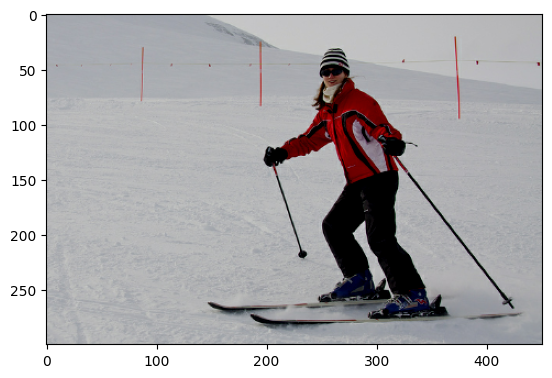

In [16]:
x_brightness = tf.image.random_brightness(x, 75)
plt.imshow(x_brightness/255)

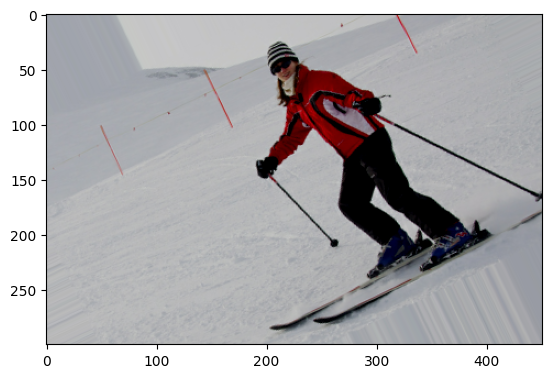

In [17]:
# Define the rotation angle in radians
rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

# Apply the rotation using tfa.image.rotate
x_rotated = tfa.image.rotate(x_brightness, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
plt.imshow(x_rotated/255)

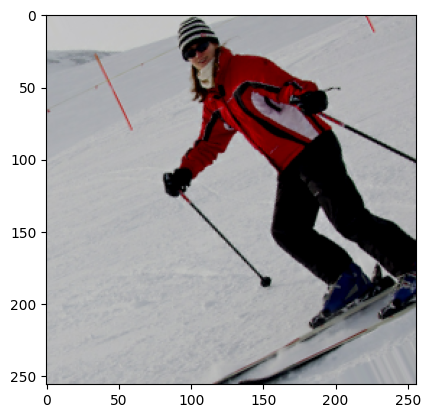

In [18]:
x_aug = random_crop(x_rotated)
plt.imshow(x_aug/255.0)

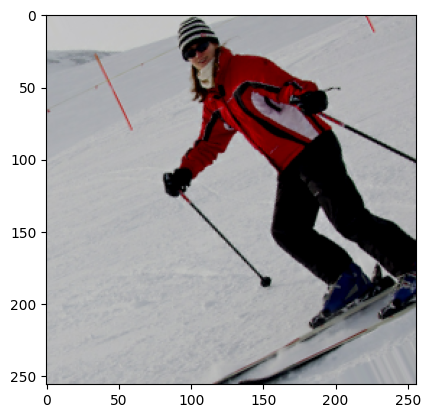

In [19]:
x_jitter = random_jitter(x_aug)
plt.imshow(x_jitter/255.0)

In [20]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 75)
    # Define the rotation angle in radians
    rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
    real_image = random_crop(real_image)
    

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [21]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [22]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [23]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files('/kaggle/input/coco-2017-dataset/coco2017/train2017/*')
train_dataset = train_dataset.shuffle(10,reshuffle_each_iteration=True)
train_dataset = train_dataset.take(32000)
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

2000

In [24]:
# create input pipeline
val = tf.data.Dataset.list_files('/kaggle/input/coco-2017-dataset/coco2017/val2017/*')
val = val.take(1000)
val = val.map(load_test_image)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [25]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [26]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 226, 3)


In [27]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 452, 3)


In [28]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

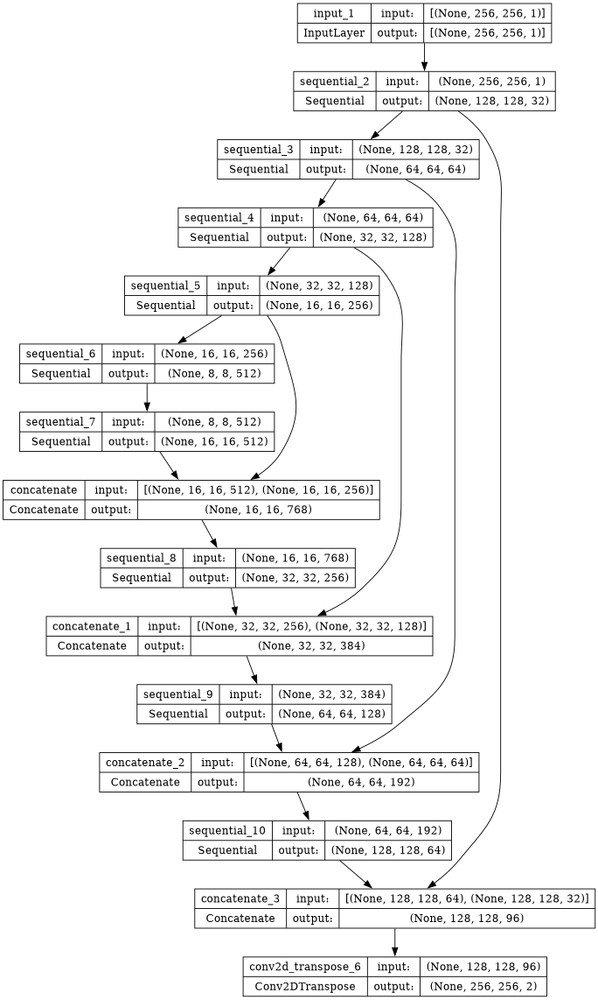

In [29]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [30]:
gen.load_weights('/kaggle/input/trainwithchangeinaugparamcoco/modelsFeb7/gen_weight.keras')

In [31]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

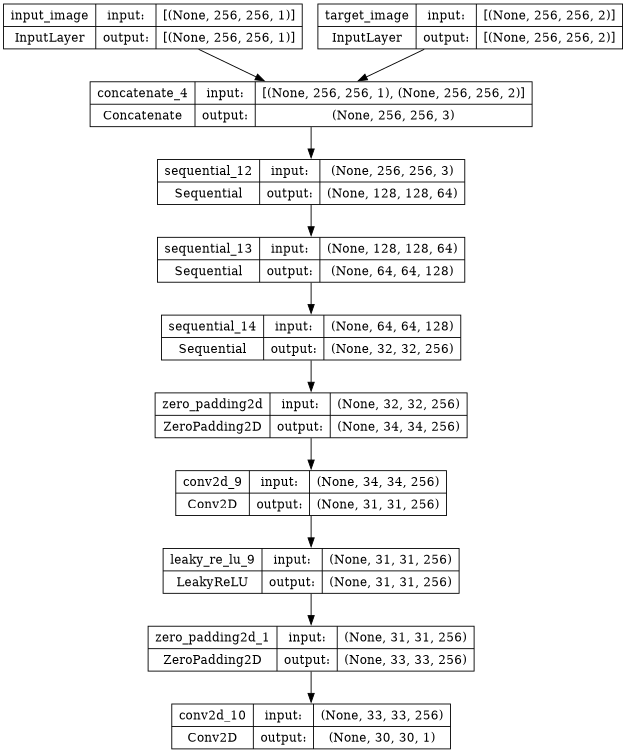

In [32]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [33]:
disc.load_weights('/kaggle/input/trainwithchangeinaugparamcoco/modelsFeb7/disc_wweight.keras')

In [34]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [35]:
LAMBDA = 150

In [36]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [37]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [38]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [39]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [40]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [41]:
epochs = 250

In [42]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [43]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [44]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [45]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [46]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [47]:
os.mkdir('/kaggle/working/gen_output/')

In [48]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [49]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image,256)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


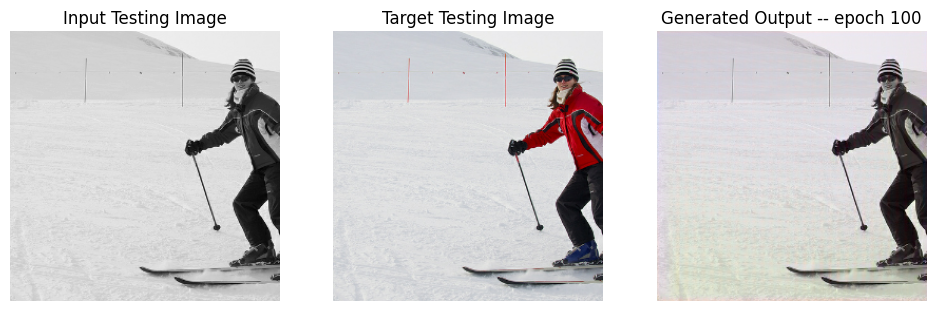

SSIM Score: 0.9377229809761047
PSNR Score: 26.098094940185547


In [50]:
display_random_test_image(gen, '/kaggle/input/coco-2017-dataset/coco2017/val2017/000000000785.jpg',100)

In [51]:
os.mkdir('/kaggle/working/modelsFeb7')

In [52]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        gen.save('/kaggle/working/modelsFeb7/gen.h5')
        gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
        disc.save('/kaggle/working/modelsFeb7/disc.h5')
        disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')
        if time.time() - time_start > 41000:
            stop_training = True
#         if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
        display_random_test_image(gen, '/kaggle/input/coco-2017-dataset/coco2017/val2017/000000000785.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [53]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 1s 0us/step
Training Details
Generator-- total_loss:10.64421 gan_loss:1.23757 l1_loss:0.05224 perceptual_loss:0.01047 Discriminator-- total_loss:1.28478 real_loss:0.61859 generated_loss:0.66619 --- SSIM 0.84851 PSNR 21.51915 LPIPS 0.00000
Time taken for epoch 1 is 2445.8368842601776 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:9.22966 gan_loss:0.39099 l1_loss:0.04898  perceptual_loss:0.00994 Discriminator-- total_loss:1.57958 real_loss:1.27996 generated_loss:0.29962 --- SSIM 0.89926 PSNR 22.21753 LPIPS 0.00000
Time taken for epoch 1 is 2489.1561868190765 sec
Number of iteration 63


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Displaying one random test image...


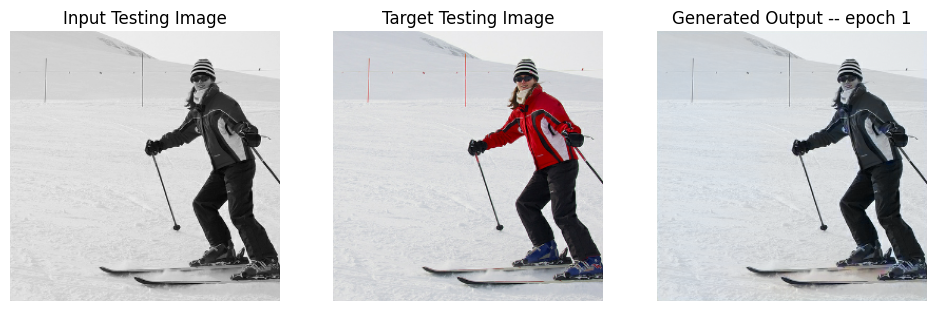

SSIM Score: 0.9544059634208679
PSNR Score: 25.273284912109375
Epoch 1
Training Details
Generator-- total_loss:10.67033 gan_loss:1.24345 l1_loss:0.05231 perceptual_loss:0.01054 Discriminator-- total_loss:1.09329 real_loss:0.51536 generated_loss:0.57793 --- SSIM 0.85033 PSNR 21.49883 LPIPS 0.00000
Time taken for epoch 2 is 2421.7651467323303 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:10.44685 gan_loss:0.65865 l1_loss:0.05441  perceptual_loss:0.01085 Discriminator-- total_loss:1.32940 real_loss:0.89974 generated_loss:0.42965 --- SSIM 0.87015 PSNR 21.26014 LPIPS 0.00000
Time taken for epoch 2 is 2463.4324309825897 sec
Number of iteration 63
Displaying one random test image...


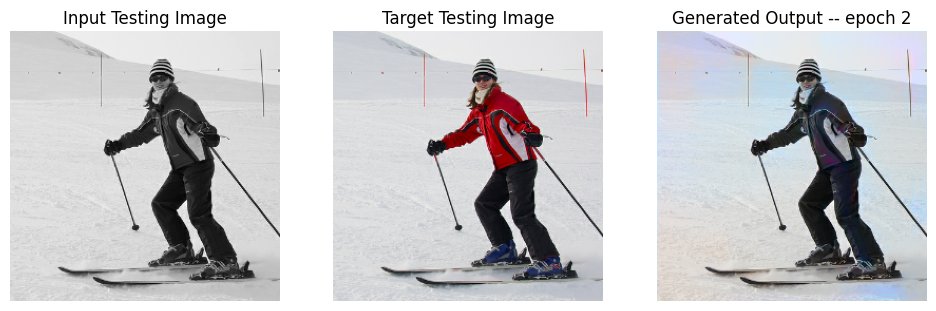

SSIM Score: 0.9413719177246094
PSNR Score: 24.654109954833984
Epoch 2
Training Details
Generator-- total_loss:10.87794 gan_loss:1.31155 l1_loss:0.05300 perceptual_loss:0.01077 Discriminator-- total_loss:1.06203 real_loss:0.50178 generated_loss:0.56026 --- SSIM 0.84774 PSNR 21.37579 LPIPS 0.00000
Time taken for epoch 3 is 2408.357739686966 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:10.28841 gan_loss:1.18639 l1_loss:0.05042  perceptual_loss:0.01026 Discriminator-- total_loss:1.40812 real_loss:0.47704 generated_loss:0.93108 --- SSIM 0.88896 PSNR 21.85468 LPIPS 0.00000
Time taken for epoch 3 is 2450.1476187705994 sec
Number of iteration 63
Displaying one random test image...


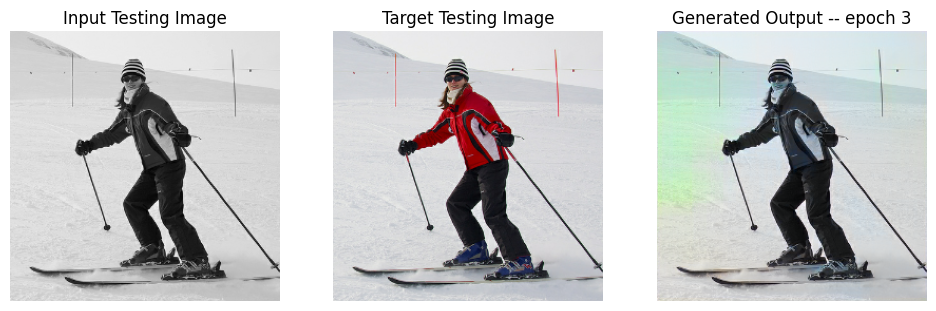

SSIM Score: 0.9460151791572571
PSNR Score: 24.2011775970459
Epoch 3
Training Details
Generator-- total_loss:10.85807 gan_loss:1.30948 l1_loss:0.05283 perceptual_loss:0.01083 Discriminator-- total_loss:1.05528 real_loss:0.49829 generated_loss:0.55699 --- SSIM 0.84688 PSNR 21.38799 LPIPS 0.00000
Time taken for epoch 4 is 2408.2330918312073 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:10.17529 gan_loss:1.50815 l1_loss:0.04760  perceptual_loss:0.01018 Discriminator-- total_loss:1.54249 real_loss:0.31354 generated_loss:1.22895 --- SSIM 0.89910 PSNR 22.22880 LPIPS 0.00000
Time taken for epoch 4 is 2449.4692142009735 sec
Number of iteration 63
Displaying one random test image...


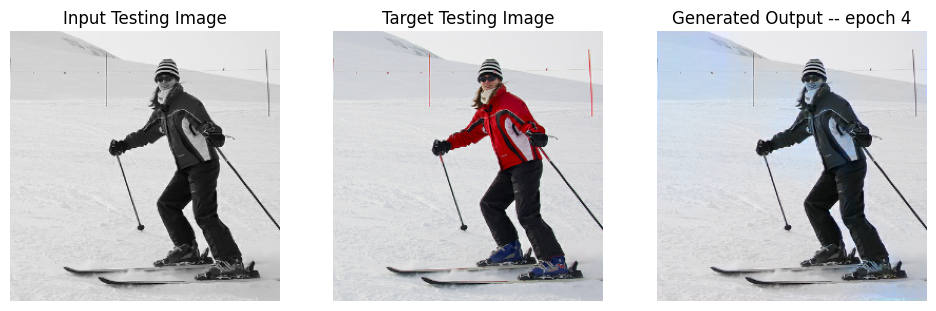

SSIM Score: 0.9474415183067322
PSNR Score: 24.587121963500977
Epoch 4
Training Details
Generator-- total_loss:10.91147 gan_loss:1.34573 l1_loss:0.05293 perceptual_loss:0.01084 Discriminator-- total_loss:1.04417 real_loss:0.49186 generated_loss:0.55230 --- SSIM 0.84623 PSNR 21.39017 LPIPS 0.00000
Time taken for epoch 5 is 2400.699738264084 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:10.60949 gan_loss:0.50443 l1_loss:0.05549  perceptual_loss:0.01188 Discriminator-- total_loss:1.49290 real_loss:1.18721 generated_loss:0.30569 --- SSIM 0.87306 PSNR 20.83906 LPIPS 0.00000
Time taken for epoch 5 is 2441.326342821121 sec
Number of iteration 63
Displaying one random test image...


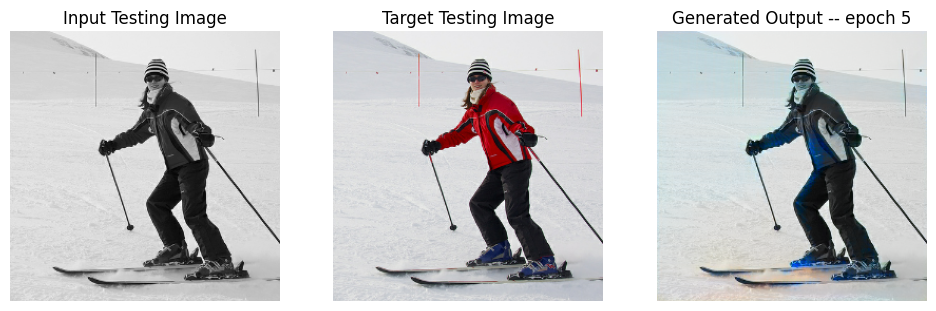

SSIM Score: 0.9377592206001282
PSNR Score: 23.421350479125977
Epoch 5
Training Details
Generator-- total_loss:10.96414 gan_loss:1.37029 l1_loss:0.05305 perceptual_loss:0.01091 Discriminator-- total_loss:1.02906 real_loss:0.48713 generated_loss:0.54193 --- SSIM 0.84525 PSNR 21.35300 LPIPS 0.00000
Time taken for epoch 6 is 2406.160437822342 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:9.81384 gan_loss:0.88390 l1_loss:0.04871  perceptual_loss:0.01082 Discriminator-- total_loss:1.51048 real_loss:0.68218 generated_loss:0.82830 --- SSIM 0.89787 PSNR 22.11292 LPIPS 0.00000
Time taken for epoch 6 is 2448.3551046848297 sec
Number of iteration 63
Displaying one random test image...


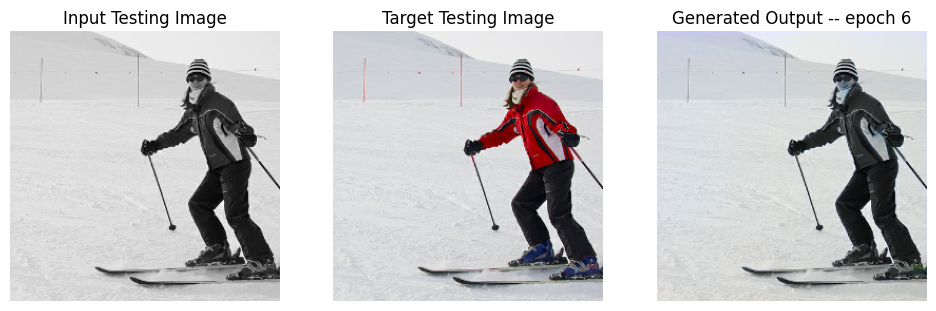

SSIM Score: 0.9544458389282227
PSNR Score: 25.510009765625
Epoch 6
Training Details
Generator-- total_loss:10.99311 gan_loss:1.38852 l1_loss:0.05308 perceptual_loss:0.01095 Discriminator-- total_loss:1.01975 real_loss:0.48233 generated_loss:0.53743 --- SSIM 0.84566 PSNR 21.34459 LPIPS 0.00000
Time taken for epoch 7 is 2402.2880041599274 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:10.58434 gan_loss:1.68836 l1_loss:0.04895  perceptual_loss:0.01035 Discriminator-- total_loss:1.53597 real_loss:0.28926 generated_loss:1.24672 --- SSIM 0.89678 PSNR 22.14038 LPIPS 0.00000
Time taken for epoch 7 is 2443.7355031967163 sec
Number of iteration 63
Displaying one random test image...


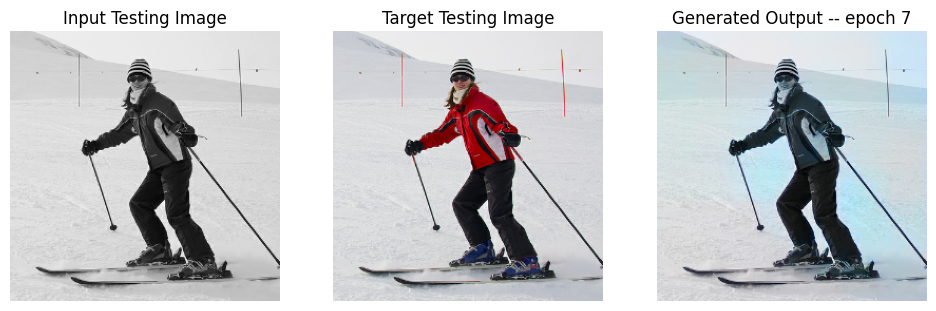

SSIM Score: 0.9386129975318909
PSNR Score: 23.461910247802734
Epoch 7
Training Details
Generator-- total_loss:10.98472 gan_loss:1.41823 l1_loss:0.05283 perceptual_loss:0.01095 Discriminator-- total_loss:1.01183 real_loss:0.47915 generated_loss:0.53268 --- SSIM 0.84534 PSNR 21.38325 LPIPS 0.00000
Time taken for epoch 8 is 2401.7847917079926 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:9.64172 gan_loss:0.52983 l1_loss:0.05052  perceptual_loss:0.01023 Discriminator-- total_loss:1.71072 real_loss:1.21998 generated_loss:0.49075 --- SSIM 0.89431 PSNR 21.64574 LPIPS 0.00000
Time taken for epoch 8 is 2442.88618183136 sec
Number of iteration 63
Displaying one random test image...


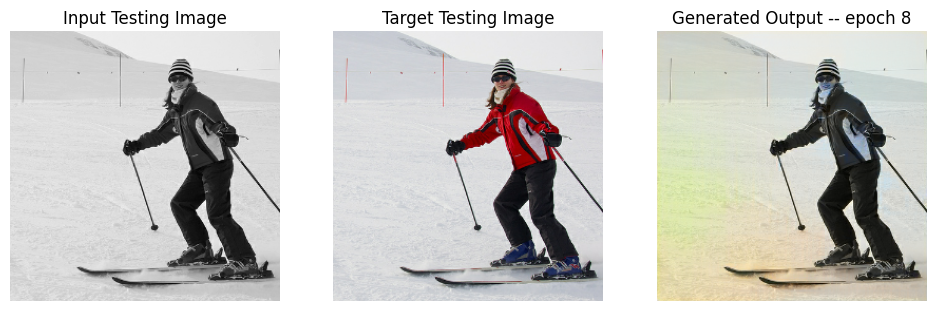

SSIM Score: 0.944924533367157
PSNR Score: 22.376102447509766
Epoch 8
Training Details
Generator-- total_loss:11.03337 gan_loss:1.42558 l1_loss:0.05304 perceptual_loss:0.01101 Discriminator-- total_loss:1.00536 real_loss:0.47625 generated_loss:0.52911 --- SSIM 0.84368 PSNR 21.32925 LPIPS 0.00000
Time taken for epoch 9 is 2406.9809460639954 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:11.30562 gan_loss:1.00166 l1_loss:0.05762  perceptual_loss:0.01108 Discriminator-- total_loss:1.36831 real_loss:0.69191 generated_loss:0.67640 --- SSIM 0.87921 PSNR 20.55939 LPIPS 0.00000
Time taken for epoch 9 is 2448.5162036418915 sec
Number of iteration 63
Displaying one random test image...


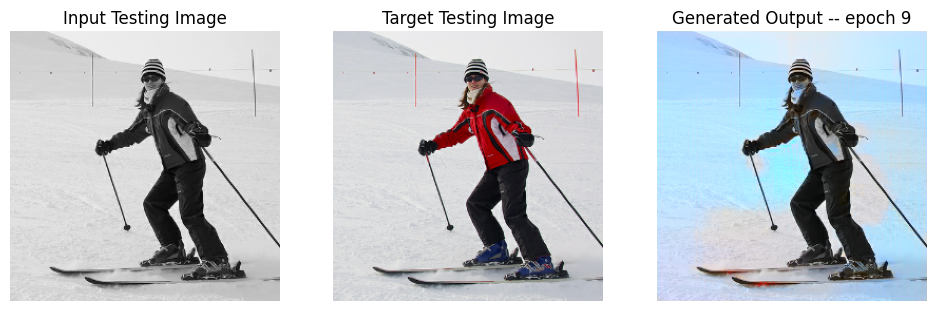

SSIM Score: 0.8919963240623474
PSNR Score: 19.09902572631836
Epoch 9
Training Details
Generator-- total_loss:9.99180 gan_loss:0.55035 l1_loss:0.05242 perceptual_loss:0.01053 Discriminator-- total_loss:2.03123 real_loss:1.41914 generated_loss:0.61209 --- SSIM 0.82971 PSNR 21.48601 LPIPS 0.00000
Time taken for epoch 10 is 2168.632807970047 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.79522 gan_loss:0.19297 l1_loss:0.04731  perceptual_loss:0.01004 Discriminator-- total_loss:2.89213 real_loss:2.04854 generated_loss:0.84360 --- SSIM 0.89368 PSNR 22.58321 LPIPS 0.00000
Time taken for epoch 10 is 2209.607400894165 sec
Number of iteration 63
Displaying one random test image...


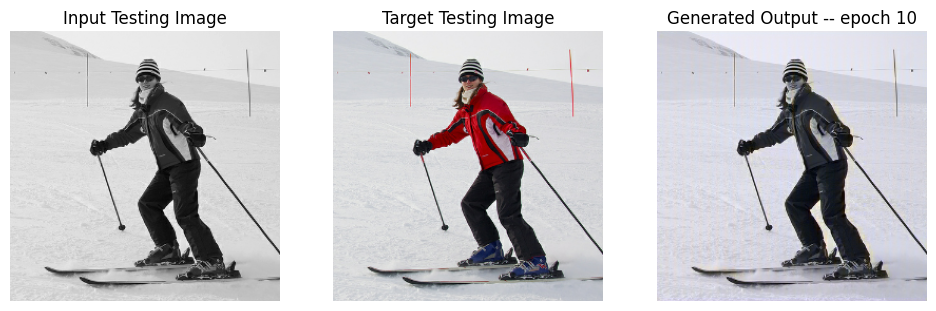

SSIM Score: 0.9205754399299622
PSNR Score: 25.152233123779297
Epoch 10
Training Details
Generator-- total_loss:8.90181 gan_loss:0.32120 l1_loss:0.04697 perceptual_loss:0.01023 Discriminator-- total_loss:2.58142 real_loss:1.95565 generated_loss:0.62577 --- SSIM 0.86150 PSNR 22.66804 LPIPS 0.00000
Time taken for epoch 11 is 2171.6000397205353 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.57628 gan_loss:0.10910 l1_loss:0.04638  perceptual_loss:0.01007 Discriminator-- total_loss:4.14853 real_loss:2.89151 generated_loss:1.25702 --- SSIM 0.90191 PSNR 22.96396 LPIPS 0.00000
Time taken for epoch 11 is 2212.4971277713776 sec
Number of iteration 63
Displaying one random test image...


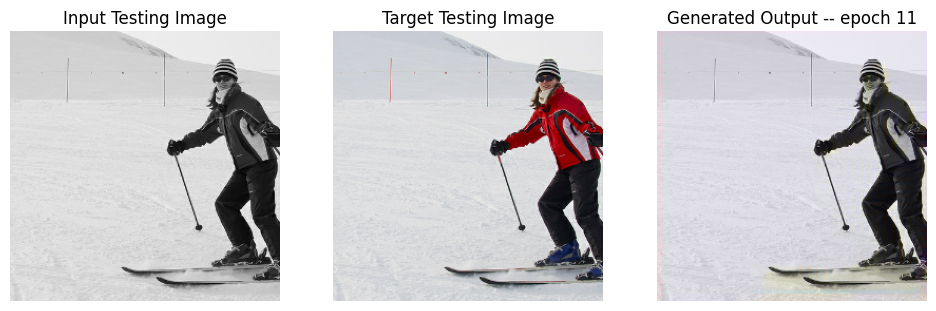

SSIM Score: 0.9433444142341614
PSNR Score: 25.65286636352539
Epoch 11
Training Details
Generator-- total_loss:19.93617 gan_loss:11.53876 l1_loss:0.04583 perceptual_loss:0.01015 Discriminator-- total_loss:0.00441 real_loss:0.00200 generated_loss:0.00241 --- SSIM 0.86831 PSNR 23.06489 LPIPS 0.00000
Time taken for epoch 12 is 1631.239539384842 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.34319 gan_loss:0.01319 l1_loss:0.04552  perceptual_loss:0.01002 Discriminator-- total_loss:5.80450 real_loss:5.79973 generated_loss:0.00477 --- SSIM 0.90083 PSNR 22.88885 LPIPS 0.00000
Time taken for epoch 12 is 1672.1754224300385 sec
Number of iteration 63
Displaying one random test image...


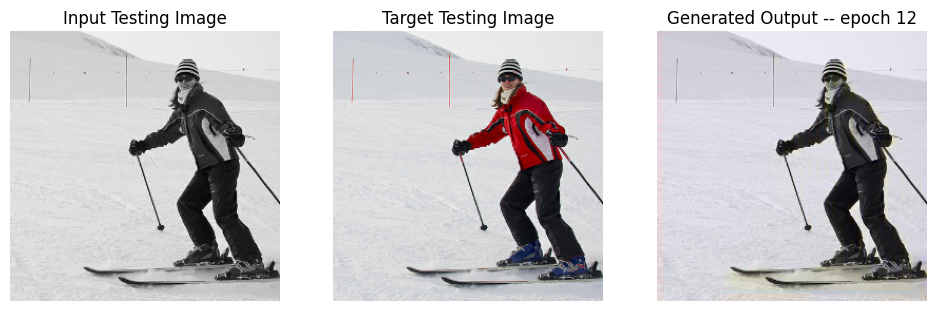

SSIM Score: 0.9405003190040588
PSNR Score: 25.54354476928711
Epoch 12
Training Details
Generator-- total_loss:24.07912 gan_loss:15.65776 l1_loss:0.04598 perceptual_loss:0.01016 Discriminator-- total_loss:0.00018 real_loss:0.00008 generated_loss:0.00010 --- SSIM 0.86771 PSNR 23.04931 LPIPS 0.00000
Time taken for epoch 13 is 1617.7076976299286 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.46972 gan_loss:0.00190 l1_loss:0.04621  perceptual_loss:0.01024 Discriminator-- total_loss:8.24920 real_loss:8.24797 generated_loss:0.00123 --- SSIM 0.89946 PSNR 22.93571 LPIPS 0.00000
Time taken for epoch 13 is 1658.682673215866 sec
Number of iteration 63
Displaying one random test image...


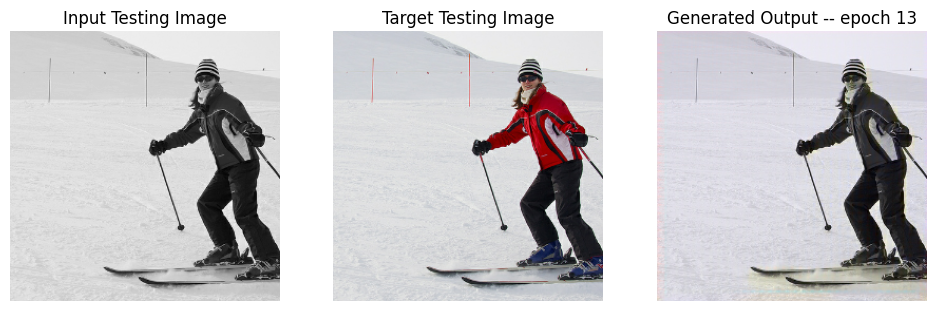

SSIM Score: 0.9413591027259827
PSNR Score: 25.566402435302734
Epoch 13
Training Details
Generator-- total_loss:26.12012 gan_loss:17.69500 l1_loss:0.04601 perceptual_loss:0.01016 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00001 --- SSIM 0.86774 PSNR 23.04165 LPIPS 0.00000
Time taken for epoch 14 is 1618.5845940113068 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.48087 gan_loss:0.00264 l1_loss:0.04647  perceptual_loss:0.01005 Discriminator-- total_loss:8.24846 real_loss:8.24801 generated_loss:0.00045 --- SSIM 0.90107 PSNR 22.89518 LPIPS 0.00000
Time taken for epoch 14 is 1659.3715257644653 sec
Number of iteration 63
Displaying one random test image...


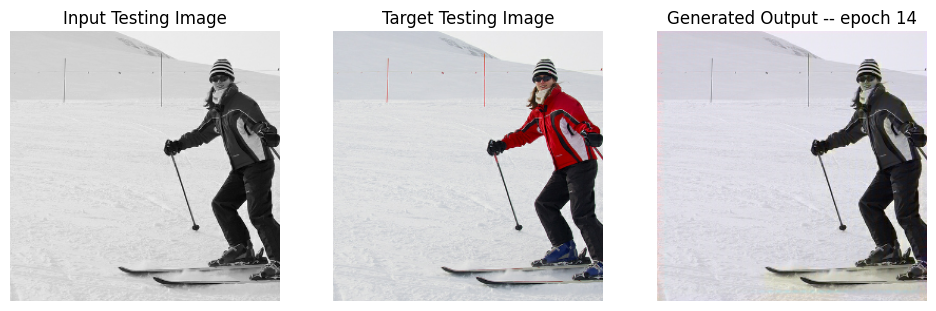

SSIM Score: 0.9425786137580872
PSNR Score: 25.60903549194336
Epoch 14
Training Details
Generator-- total_loss:28.83728 gan_loss:20.40523 l1_loss:0.04601 perceptual_loss:0.01021 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.86682 PSNR 23.02752 LPIPS 0.00000
Time taken for epoch 15 is 1600.9907338619232 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.25908 gan_loss:0.00081 l1_loss:0.04515  perceptual_loss:0.00990 Discriminator-- total_loss:10.13164 real_loss:10.13157 generated_loss:0.00008 --- SSIM 0.90373 PSNR 23.05233 LPIPS 0.00000
Time taken for epoch 15 is 1641.619782447815 sec
Number of iteration 63
Displaying one random test image...


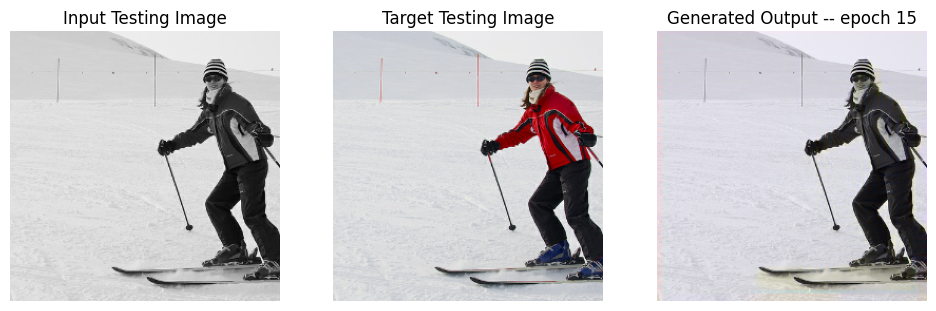

SSIM Score: 0.9419500231742859
PSNR Score: 25.591066360473633
Epoch 15
Training Details
Generator-- total_loss:22.07945 gan_loss:13.65498 l1_loss:0.04596 perceptual_loss:0.01020 Discriminator-- total_loss:0.16736 real_loss:0.10397 generated_loss:0.06339 --- SSIM 0.86761 PSNR 23.02340 LPIPS 0.00000
Time taken for epoch 16 is 1608.3908474445343 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.28757 gan_loss:0.02504 l1_loss:0.04542  perceptual_loss:0.00966 Discriminator-- total_loss:5.32137 real_loss:5.31437 generated_loss:0.00700 --- SSIM 0.90159 PSNR 23.02239 LPIPS 0.00000
Time taken for epoch 16 is 1648.8207182884216 sec
Number of iteration 63
Displaying one random test image...


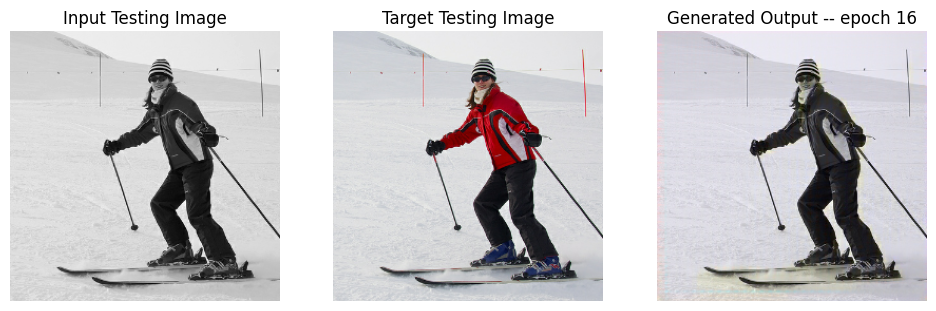

SSIM Score: 0.9389832019805908
PSNR Score: 25.478445053100586
Epoch 16
Training Details
Generator-- total_loss:22.09283 gan_loss:13.67917 l1_loss:0.04591 perceptual_loss:0.01018 Discriminator-- total_loss:0.00014 real_loss:0.00007 generated_loss:0.00007 --- SSIM 0.86773 PSNR 23.06623 LPIPS 0.00000
Time taken for epoch 17 is 1626.7365307807922 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.32925 gan_loss:0.01156 l1_loss:0.04569  perceptual_loss:0.00976 Discriminator-- total_loss:6.47704 real_loss:6.47361 generated_loss:0.00343 --- SSIM 0.90229 PSNR 23.04970 LPIPS 0.00000
Time taken for epoch 17 is 1668.7686059474945 sec
Number of iteration 63
Displaying one random test image...


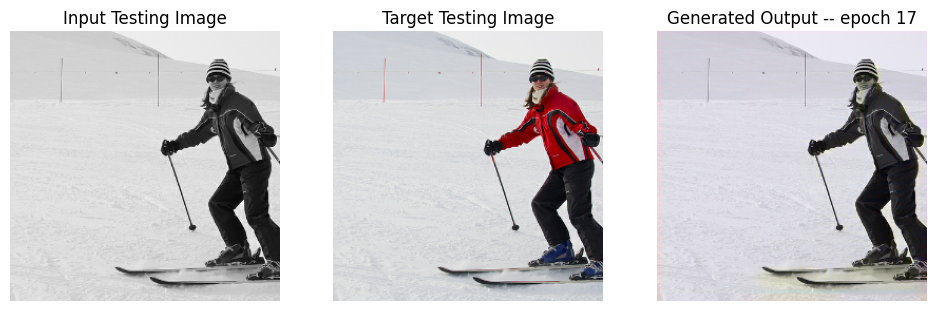

SSIM Score: 0.9415915608406067
PSNR Score: 25.606605529785156
Epoch 17
Training Details
Generator-- total_loss:24.28708 gan_loss:15.84253 l1_loss:0.04606 perceptual_loss:0.01023 Discriminator-- total_loss:0.00003 real_loss:0.00002 generated_loss:0.00002 --- SSIM 0.86694 PSNR 23.01504 LPIPS 0.00000
Time taken for epoch 18 is 1651.464026927948 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.25982 gan_loss:0.00834 l1_loss:0.04533  perceptual_loss:0.00968 Discriminator-- total_loss:7.54157 real_loss:7.54027 generated_loss:0.00130 --- SSIM 0.90247 PSNR 23.18163 LPIPS 0.00000
Time taken for epoch 18 is 1693.1603314876556 sec
Number of iteration 63
Displaying one random test image...


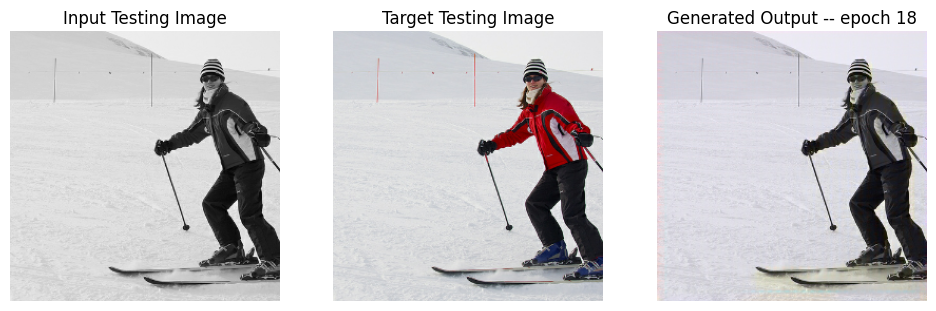

SSIM Score: 0.9414065480232239
PSNR Score: 25.568115234375
Epoch 18
Training Details
Generator-- total_loss:25.96032 gan_loss:17.53238 l1_loss:0.04606 perceptual_loss:0.01012 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00001 --- SSIM 0.86647 PSNR 23.02834 LPIPS 0.00000
Time taken for epoch 19 is 1656.1279969215393 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.29712 gan_loss:0.00743 l1_loss:0.04532  perceptual_loss:0.00994 Discriminator-- total_loss:8.03777 real_loss:8.03701 generated_loss:0.00075 --- SSIM 0.90334 PSNR 23.05950 LPIPS 0.00000
Time taken for epoch 19 is 1698.0455794334412 sec
Number of iteration 63
Displaying one random test image...


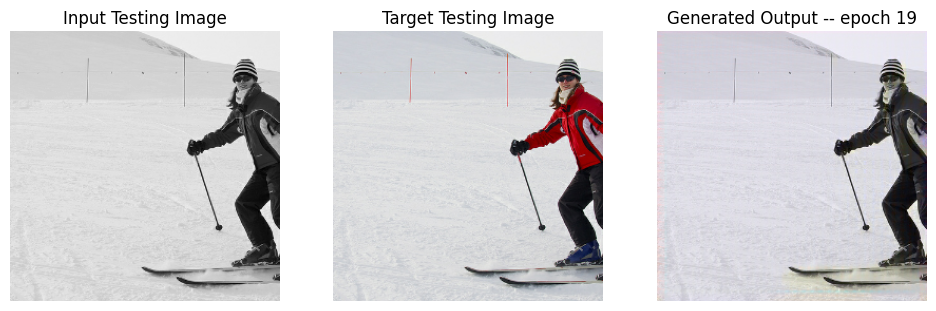

SSIM Score: 0.9473042488098145
PSNR Score: 26.15335464477539
Epoch 19
Training Details
Generator-- total_loss:28.17760 gan_loss:19.78112 l1_loss:0.04584 perceptual_loss:0.01014 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.86770 PSNR 23.05748 LPIPS 0.00000
Time taken for epoch 20 is 1653.3696036338806 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.38057 gan_loss:0.00220 l1_loss:0.04562  perceptual_loss:0.01024 Discriminator-- total_loss:9.25316 real_loss:9.25286 generated_loss:0.00030 --- SSIM 0.90174 PSNR 23.05818 LPIPS 0.00000
Time taken for epoch 20 is 1694.9865863323212 sec
Number of iteration 63
Displaying one random test image...


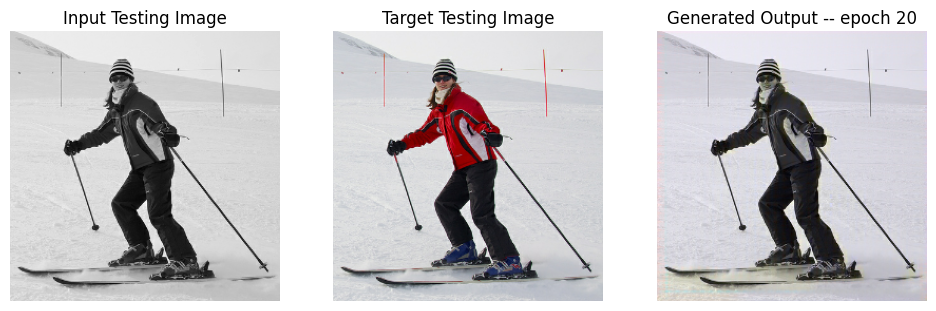

SSIM Score: 0.9408936500549316
PSNR Score: 25.5009822845459


In [54]:
fit(train_dataset, epochs, val, gen)

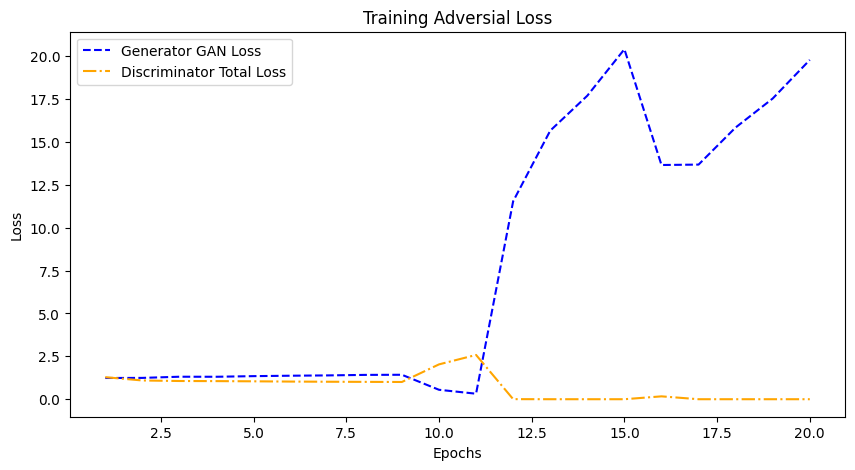

In [55]:
epochs = range(1, len(train_generator_losses) + 1)
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Training Adversial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

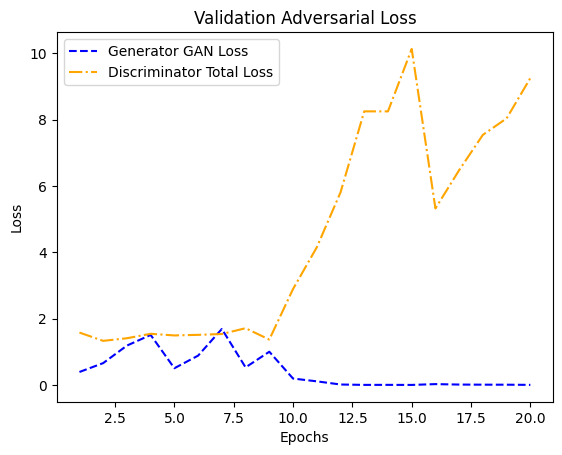

In [56]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Validation Adversarial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

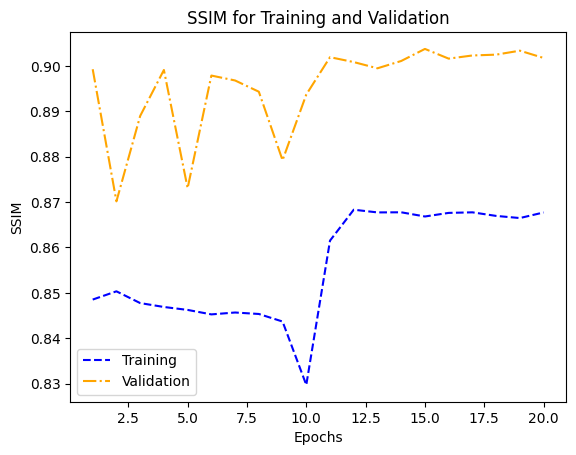

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

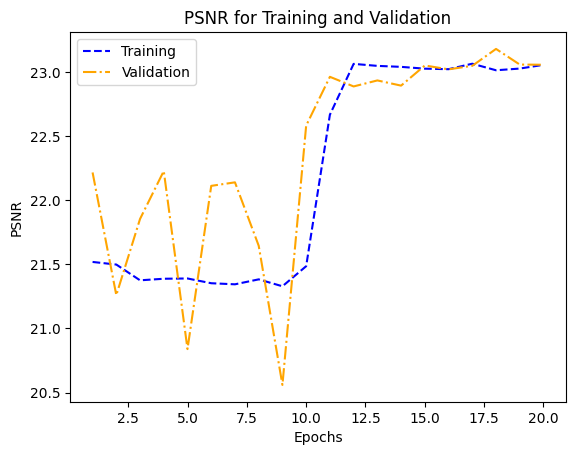

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

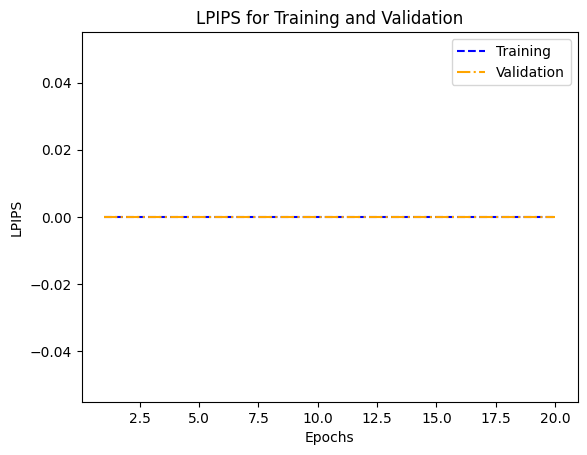

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

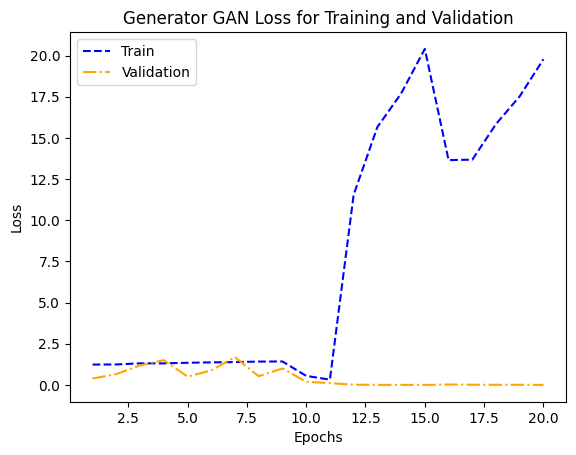

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

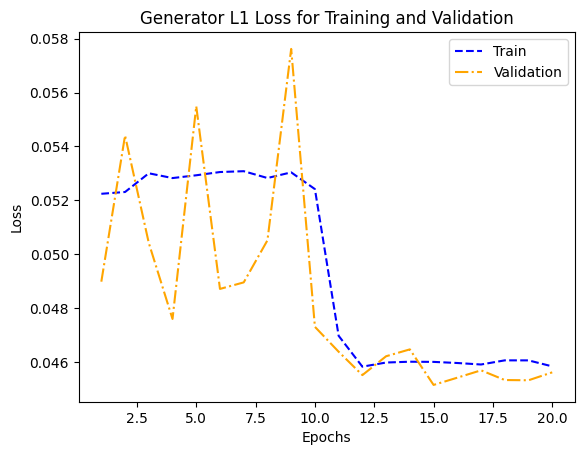

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

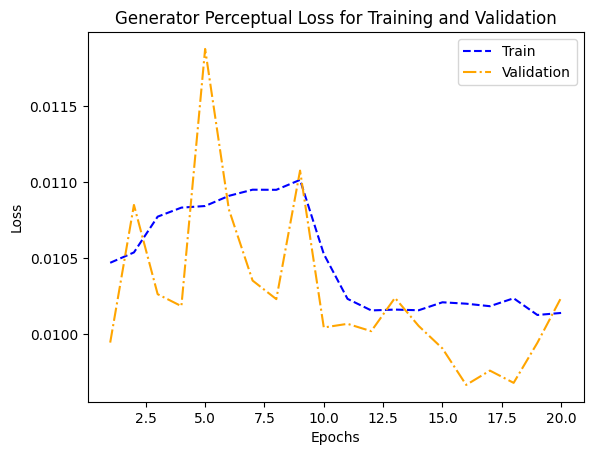

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

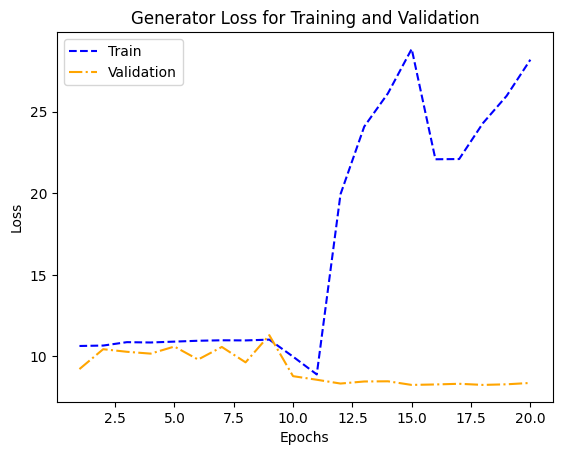

In [63]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

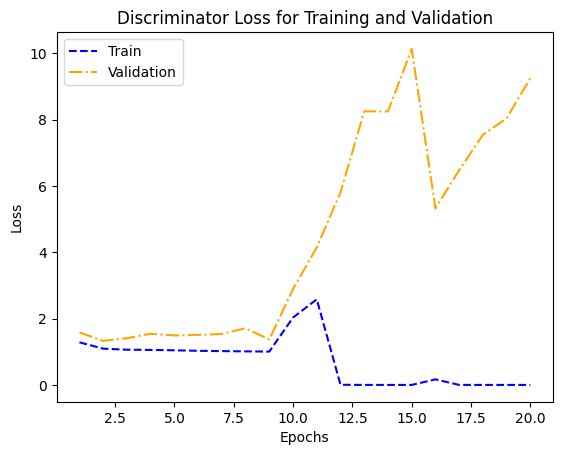

In [64]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

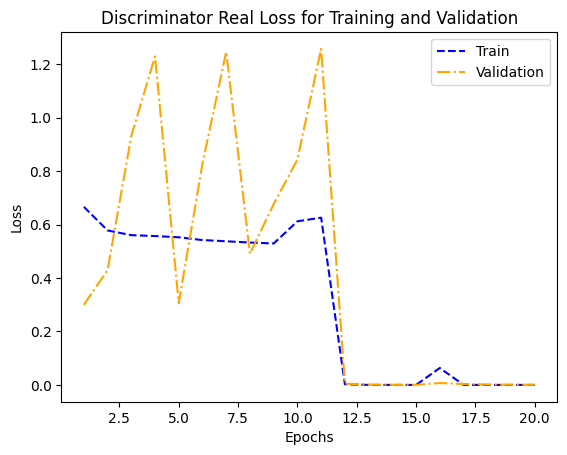

In [65]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

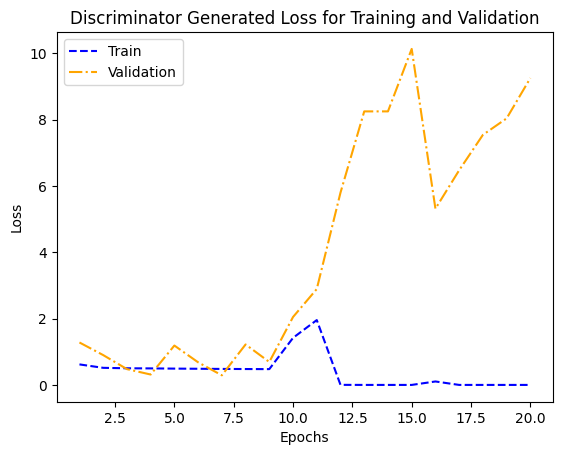

In [66]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [67]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [68]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [69]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [70]:
import subprocess
from IPython.display import FileLink, display

In [71]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip